In [1]:
mode = 'train' #'train' or 'predict'
model_type = 'vgg16'
model_tag = 'seqMT'
model_id = '{:s}_{:s}'.format(model_type, model_tag)
model_dir = './saved_model/model_{:s}.h5'.format(model_id)

freeze_backbone = True # True => transfer learning; False => train from scratch

In [3]:
import pandas as pd
import os
import json
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
%matplotlib inline
from matplotlib import pyplot as plt
from models import FacePrediction
from pathlib import Path
import glob
from PIL import Image

In [4]:
import csv

In [8]:
# keras vggface model
#from keras.engine import Model
from  tensorflow.keras.models import Model
from keras.layers import Flatten, Dense, Input, Dropout, Activation, BatchNormalization, Add
from keras_vggface.vggface import VGGFace
from keras_vggface import utils
#from keras.preprocessing import image
import keras.utils as image

class FP_MT(FacePrediction):
    
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def define_model(self, hidden_dim = 128, drop_rate=0.0, freeze_backbone = True):
        
        if self.model_type == 'vgg16_fc6':
            vgg_model = VGGFace(model = 'vgg16', include_top=True, input_shape=(224, 224, 3))
            last_layer = vgg_model.get_layer('fc6').output
            flatten = Activation('relu')(last_layer)
        else:
            vgg_model = VGGFace(model = self.model_type, include_top=False, input_shape=(224, 224, 3))
            last_layer = vgg_model.output
            flatten = Flatten()(last_layer)
        
        if freeze_backbone:
            for layer in vgg_model.layers:
                layer.trainable = False
                
        def block(flatten, name):
            x = Dense(hidden_dim, name=name + '_fc1')(flatten)
            x = BatchNormalization(name = name + '_bn1')(x)
            x = Activation('relu', name = name+'_act1')(x)
            x = Dropout(drop_rate)(x)
            x = Dense(hidden_dim, name=name + '_fc2')(x)
            x = BatchNormalization(name = name + '_bn2')(x)
            x = Activation('relu', name = name+'_act2')(x)
            x = Dropout(drop_rate)(x)
            return x
        
        x = block(flatten, name = 'sex')
        out_sex = Dense(1, activation = 'sigmoid', name = 'sex')(x)        
        
        # residual connection to age
        x1 = Dense(hidden_dim)(flatten)
        x1 = Add()([x1, x])
        x1 = block(x1, name = 'age')
        out_age = Dense(1, activation='linear', name='age')(x1)
        
        # residual connection to bmi
        x2 = Dense(hidden_dim)(flatten)
        x2 = Add()([x2, x])
        x2 = block(x2, name = 'bmi')
        out_bmi = Dense(1, activation='linear', name='bmi')(x2)
        
        custom_vgg_model = Model(vgg_model.input, [out_bmi, out_age, out_sex])
        custom_vgg_model.compile('adam', 
                                 {'bmi':'mae','age':'mae','sex':'binary_crossentropy'},
                                 {'sex': 'accuracy'}, 
                                 loss_weights={'bmi': 0.8, 'age':0.1, 'sex':0.1})

        self.model = custom_vgg_model

In [9]:
es = EarlyStopping(patience=3)
ckp = ModelCheckpoint(model_dir, save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard('./tb/%s'%(model_type))
callbacks = [es, ckp, tb]

model = FP_MT(img_dir = './data/face_aligned/', model_type = model_type)
model.define_model(freeze_backbone = freeze_backbone)
model.model.summary()

model.load_weights(model_dir)

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 224, 224, 64  1792        ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 224, 224, 64  36928       ['conv1_1[0][0]']                
                                )                                                           

 bmi_act1 (Activation)          (None, 128)          0           ['bmi_bn1[0][0]']                
                                                                                                  
 age_act1 (Activation)          (None, 128)          0           ['age_bn1[0][0]']                
                                                                                                  
 dropout_10 (Dropout)           (None, 128)          0           ['bmi_act1[0][0]']               
                                                                                                  
 dropout_8 (Dropout)            (None, 128)          0           ['age_act1[0][0]']               
                                                                                                  
 bmi_fc2 (Dense)                (None, 128)          16512       ['dropout_10[0][0]']             
                                                                                                  
 age_fc2 (

In [10]:
filename = "./csv/filename_bmi_FP_MT.csv"
#check if csv file exists or not
#delete if exists
f = open(filename, "w+")
f.close()

.DS_Store
Skipping image: ./bmi_test/.DS_Store (corrupt or unsupported format)
Cleave_2021_Summer.png
1/1 [==============================] - 0s 398ms/step
['Cleave_2021_Summer', 18.915928]
Darshan_2022_Spring.png
1/1 [==============================] - 0s 21ms/step


libpng warning: iCCP: known incorrect sRGB profile


1/1 [==============================] - 0s 118ms/step
['Darshan_2022_Spring', 18.024431]
Darshan_2018_Spring.png
1/1 [==============================] - 0s 121ms/step
['Darshan_2018_Spring', 21.554688]
Darshan_2022_Summer.png
1/1 [==============================] - 0s 124ms/step
['Darshan_2022_Summer', 19.533878]
Cleave_2021_Spring.png
Skipping image: ./bmi_test/Cleave_2021_Spring.png (corrupt or unsupported format)
Darshan_2018_Summer.png
1/1 [==============================] - 0s 123ms/step
['Darshan_2018_Summer', 19.695312]
Darshan_2017_Spring.png
1/1 [==============================] - 0s 127ms/step
['Darshan_2017_Spring', 15.210427]
Darshan_2019_Spring.png
1/1 [==============================] - 0s 121ms/step
['Darshan_2019_Spring', 20.736404]
Darshan_2016_Summer.png
1/1 [==============================] - 0s 40ms/step


libpng warning: iCCP: known incorrect sRGB profile


1/1 [==============================] - 0s 133ms/step
['Darshan_2016_Summer', 16.798311]
Darshan_2021_Spring.png
1/1 [==============================] - 0s 127ms/step
['Darshan_2021_Spring', 14.784701]
Darshan_2016_Spring.png
1/1 [==============================] - 0s 129ms/step
['Darshan_2016_Spring', 19.26917]
Darshan_2016_Summer_2.png
1/1 [==============================] - 0s 30ms/step


libpng warning: iCCP: known incorrect sRGB profile


1/1 [==============================] - 0s 130ms/step
['Darshan_2016_Summer_2', 17.837852]


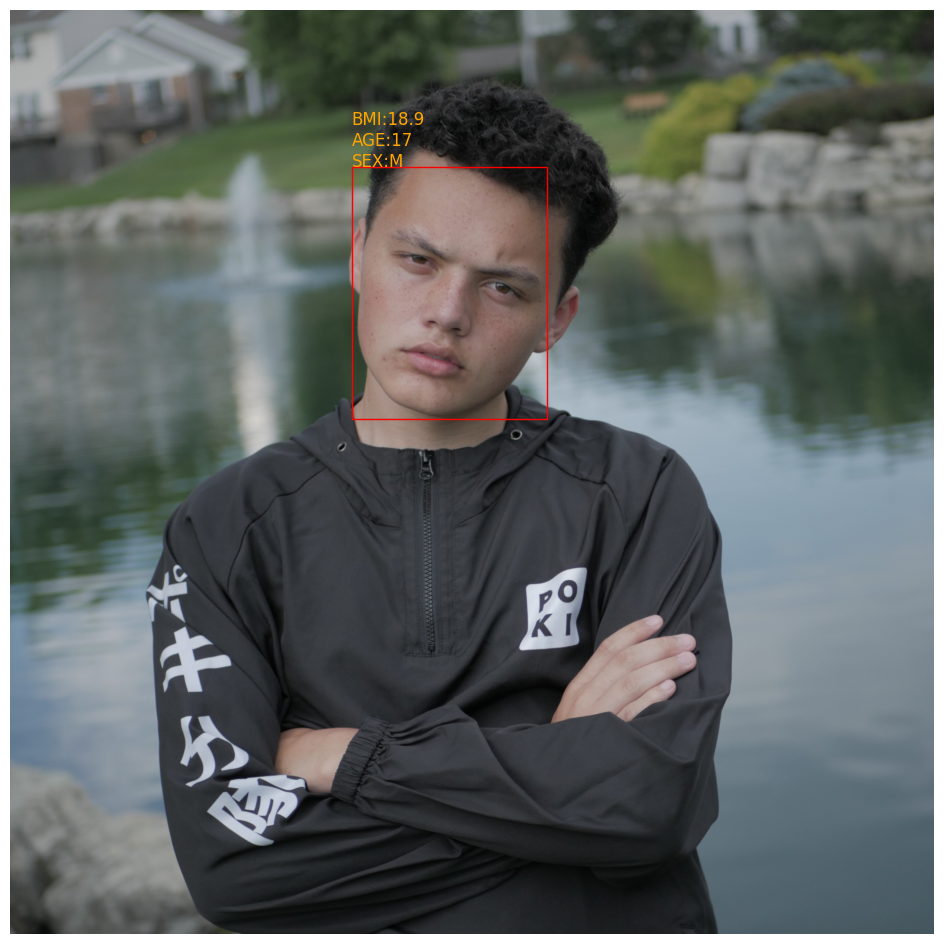

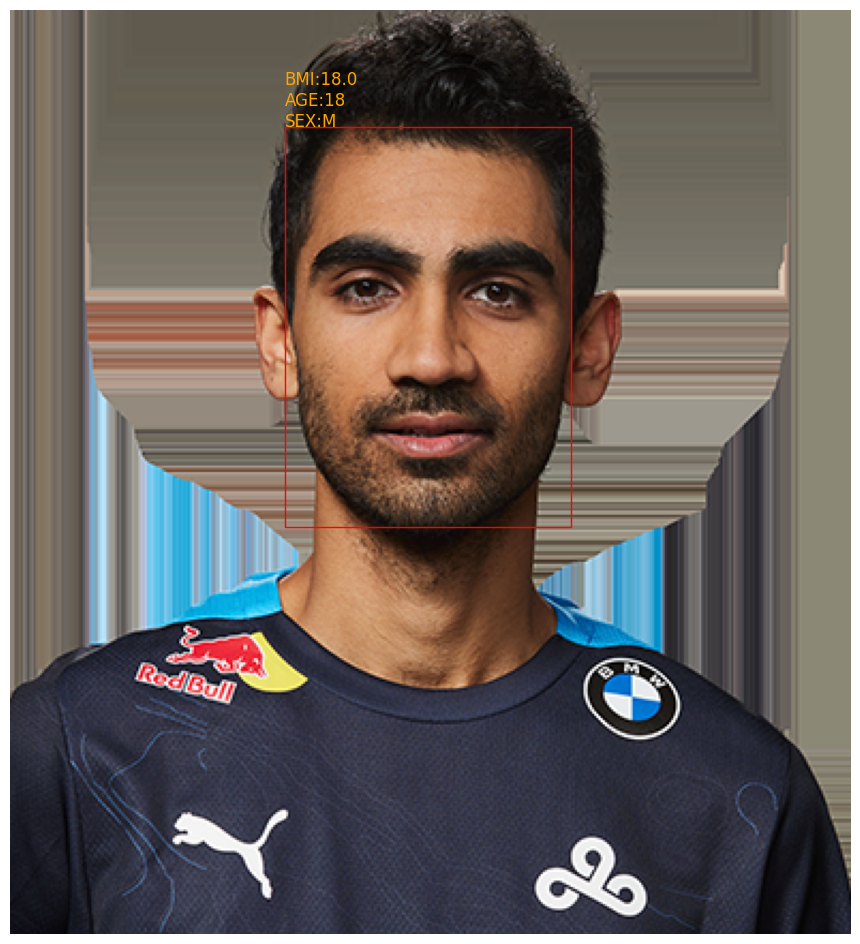

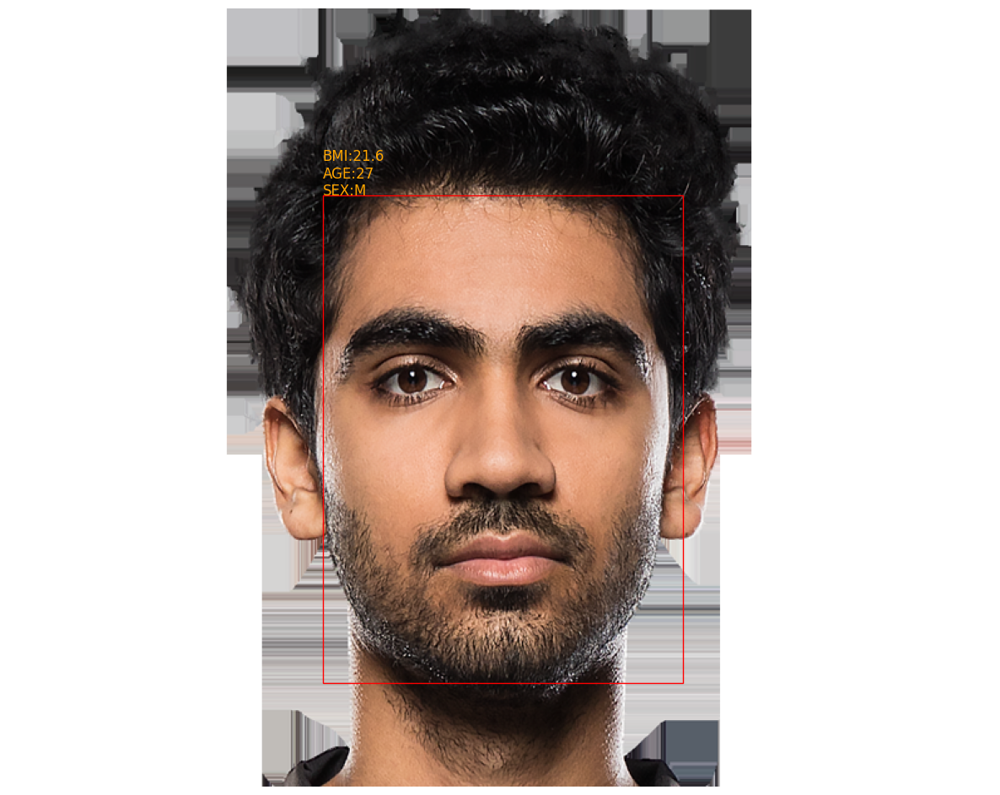

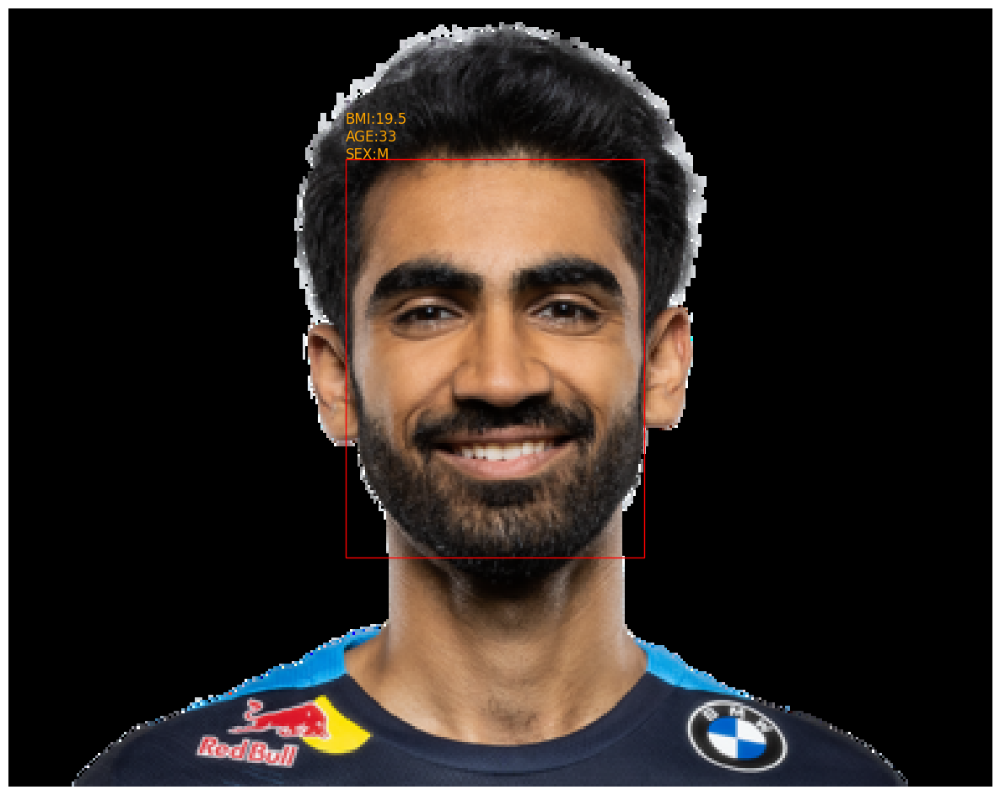

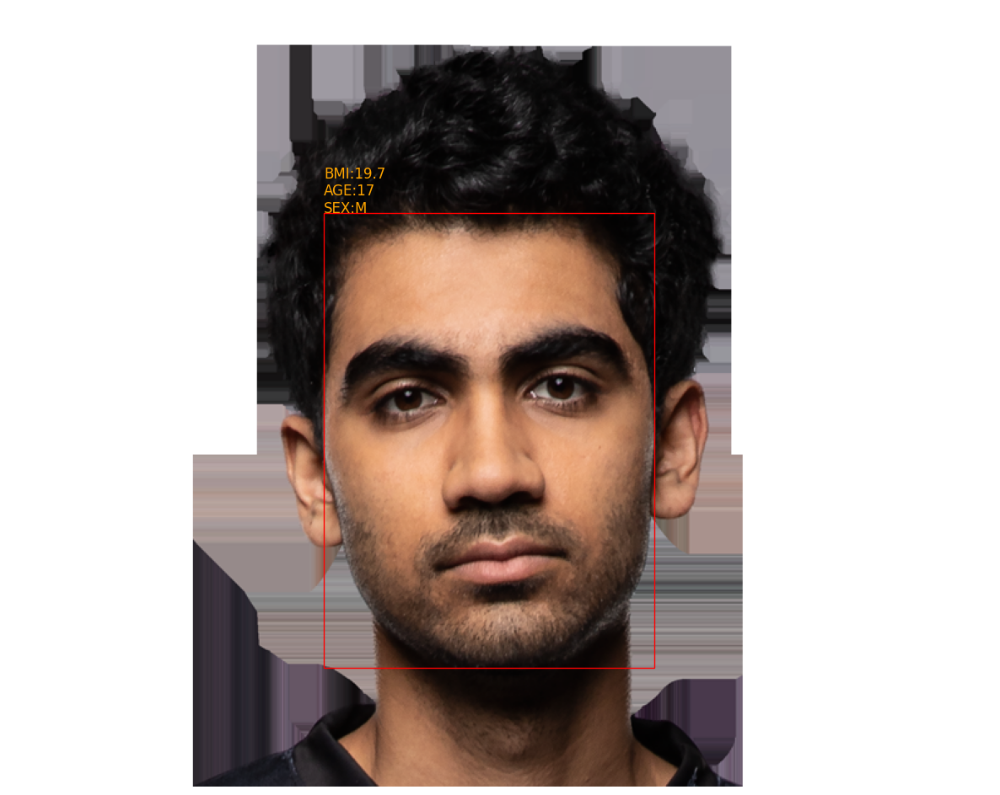

...

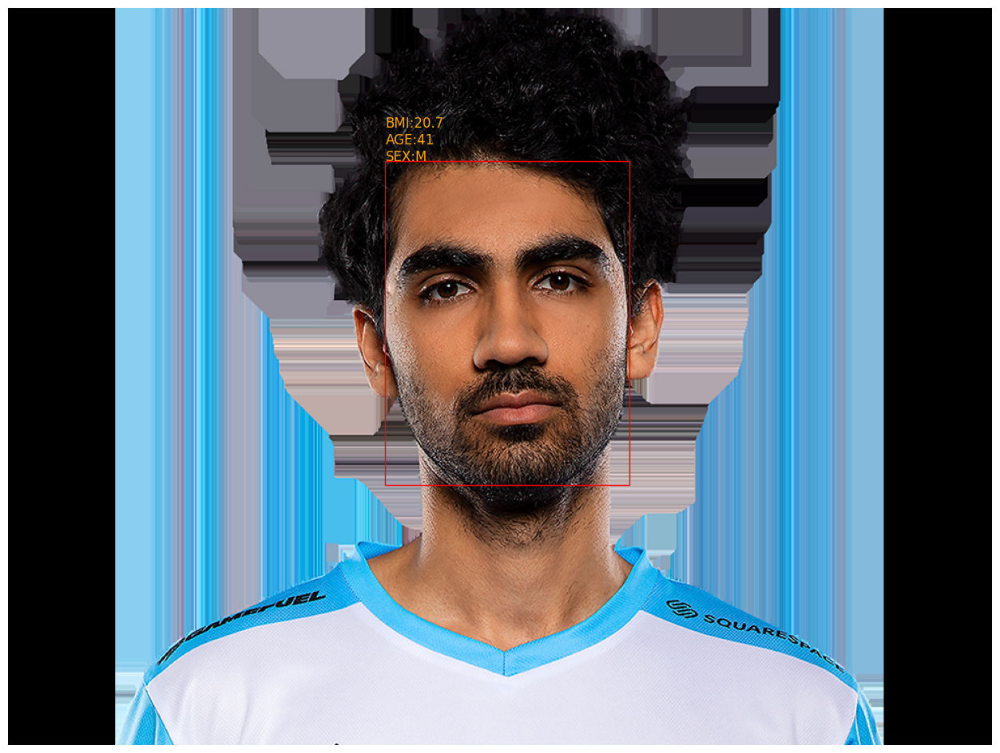

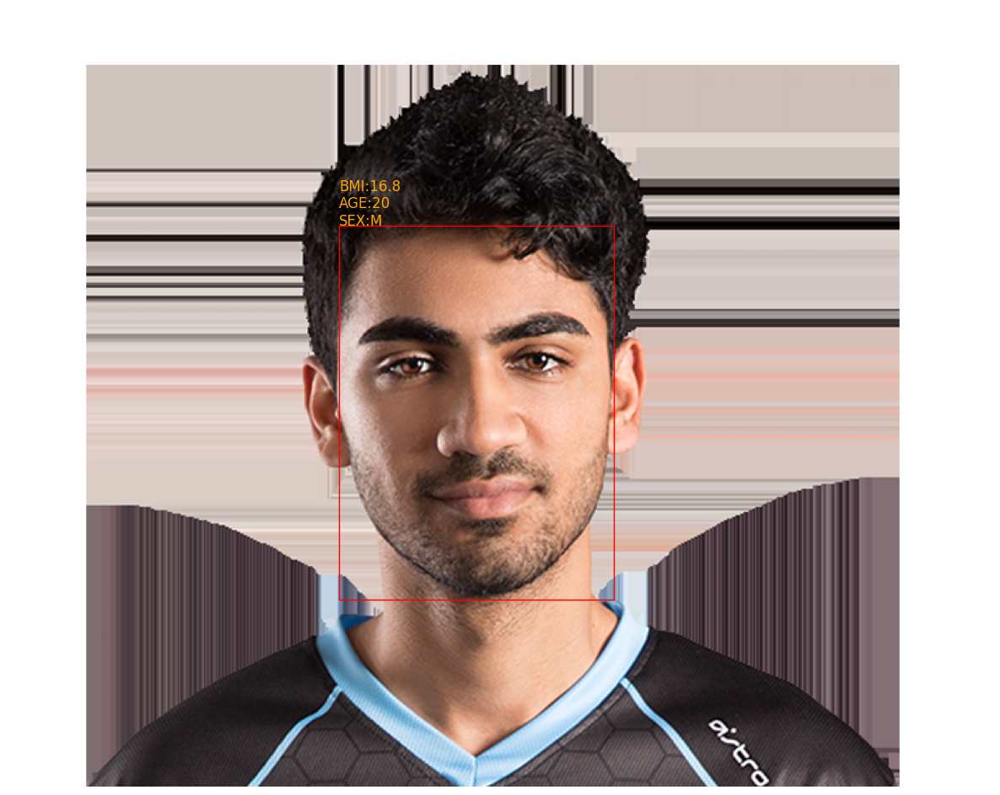

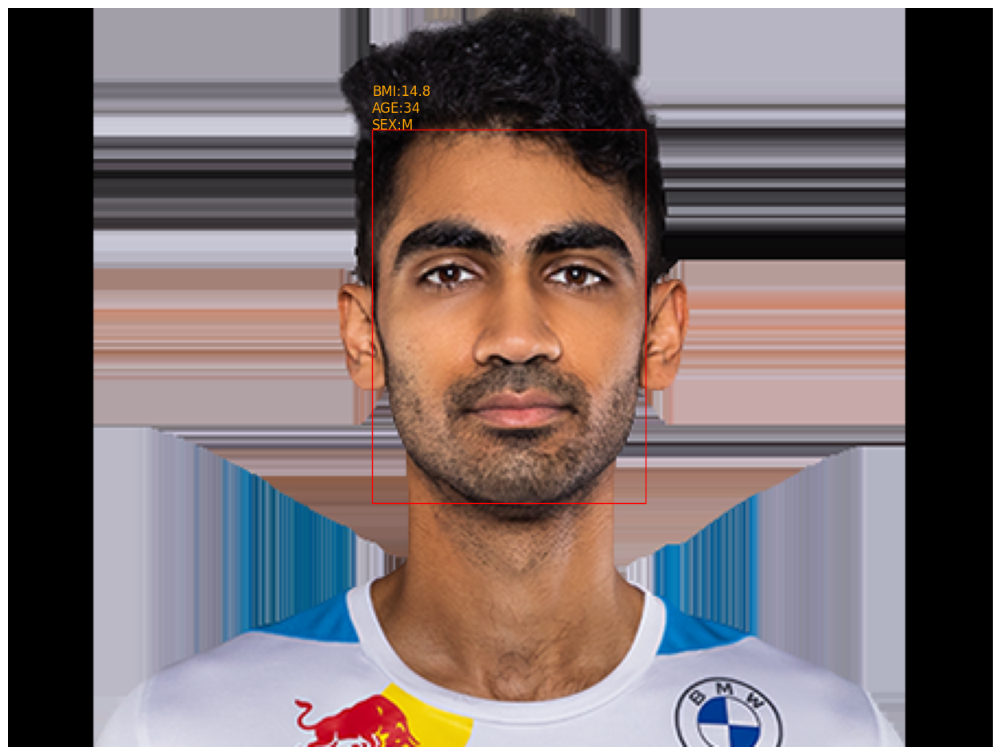

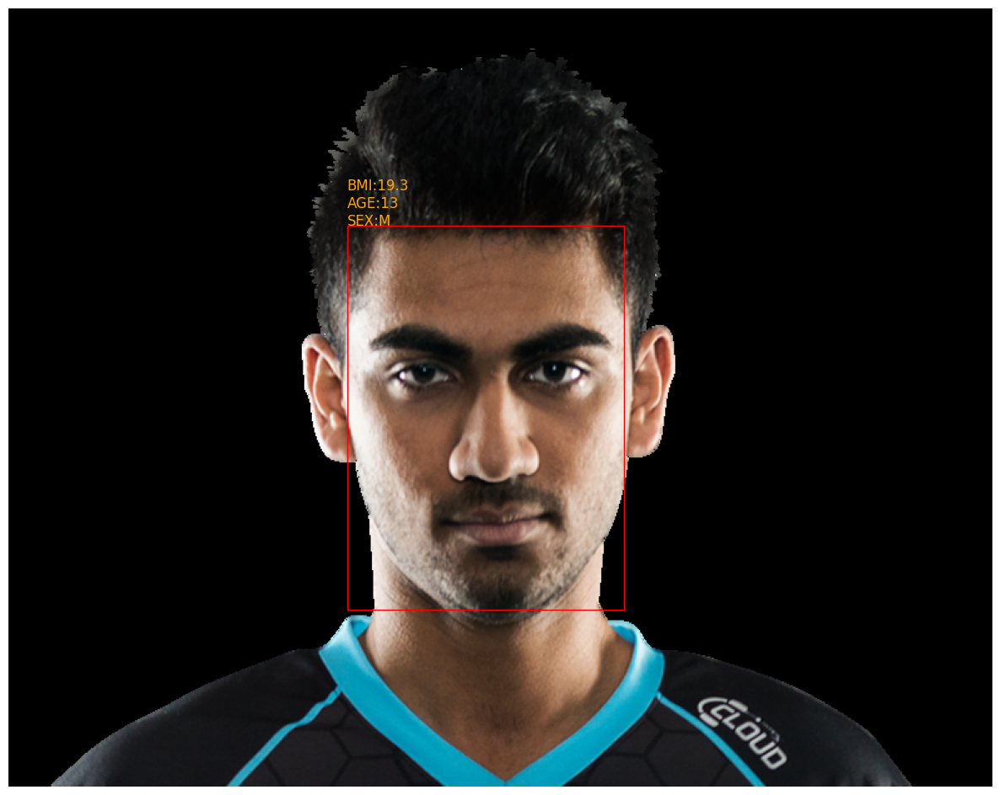

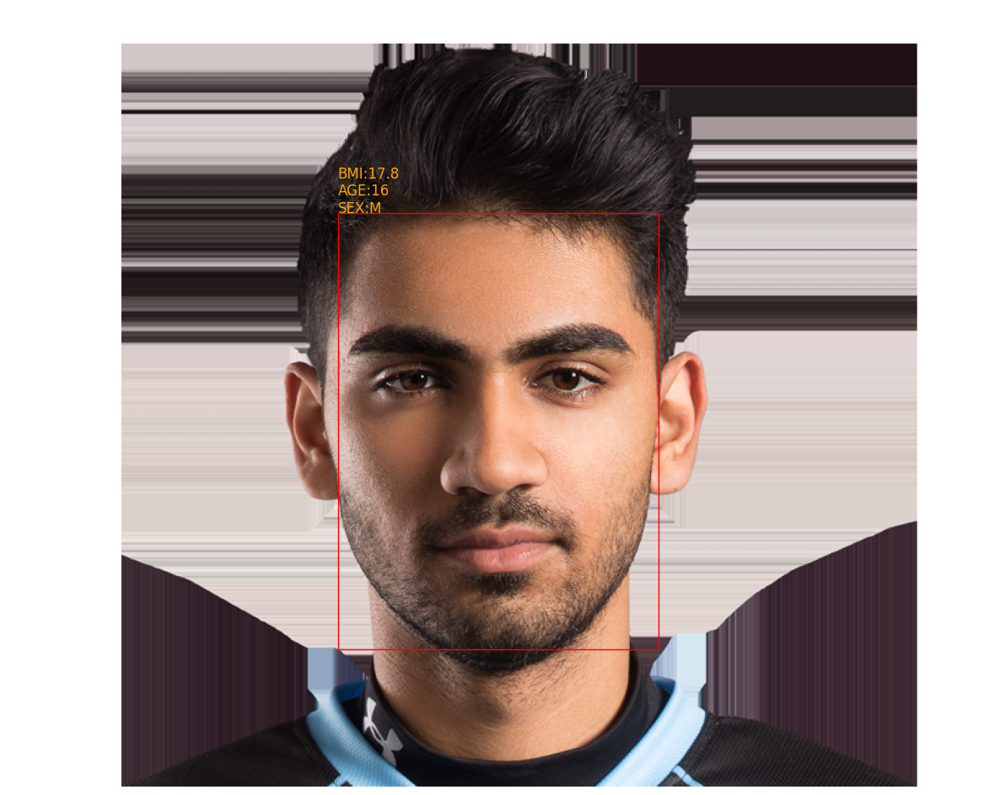

In [11]:
directory = './bmi_test/'
with open(filename, "w", newline="") as f:
    writer = csv.writer(f)
    for item in os.listdir(directory):
        print(item)
        data_arr = []
        data_arr.append(item[:-4]) # we dont want .png
        item_path = os.path.join(directory, item)
        try:
            image = Image.open(item_path)
            pred = model.predict_faces(item_path, color='orange')
            data_arr.append(pred[0][0][0][0])
            print(data_arr)
            writer.writerows([data_arr])
        except Image.UnidentifiedImageError:
            print(f"Skipping image: {item_path} (corrupt or unsupported format)")
            continue